In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2

In [3]:
class Config:
    base_dir = os.path.dirname(os.getcwd())
    data_dir = os.path.join(base_dir, 'vizviz/vqa')
    train_image_dir = os.path.join(data_dir, 'train')
    val_image_dir = os.path.join(data_dir, 'val')
    train_file_path = os.path.join(data_dir, 'train.json')
    val_file_path = os.path.join(data_dir, 'val.json')

cfg = Config()

In [7]:
train_df = pd.read_json(cfg.train_file_path)
eval_df =  pd.read_json(cfg.val_file_path)
print(f"Train Data Size : {train_df.shape[0]}")
print(f"Eval Data Size : {eval_df.shape[0]}")

Train Data Size : 20523
Eval Data Size : 4319


In [5]:
train_df.head()

,image,question,answers,answer_type,answerable
0,VizWiz_train_00000000.jpg,What's the name of this product?,"[{'answer_confidence': 'yes', 'answer': 'basil...",other,1
1,VizWiz_train_00000001.jpg,Can you tell me what is in this can please?,"[{'answer_confidence': 'yes', 'answer': 'soda'...",other,1
2,VizWiz_train_00000002.jpg,Is this enchilada sauce or is this tomatoes? ...,"[{'answer_confidence': 'yes', 'answer': 'these...",other,1
3,VizWiz_train_00000003.jpg,What is the captcha on this screenshot?,"[{'answer_confidence': 'yes', 'answer': 't36m'...",other,1
4,VizWiz_train_00000004.jpg,What is this item?,"[{'answer_confidence': 'yes', 'answer': 'solar...",other,1


In [9]:
# Unique Answer Types
train_df.answer_type.unique()

array(['other', 'yes/no', 'unanswerable', 'number'], dtype=object)

In [10]:
train_df.answer_type.value_counts()

answer_type
other           13733
unanswerable     5532
yes/no            957
number            301
Name: count, dtype: int64

In [58]:
eval_df.answer_type.value_counts()

answer_type
other           2691
unanswerable    1385
yes/no           195
number            48
Name: count, dtype: int64

In [21]:
train_df.answerable.value_counts()

answerable
1    14991
0     5532
Name: count, dtype: int64

In [19]:
answer_confidence_list = []
for answer in train_df.answers.tolist():
    for _ in answer:
        if _['answer_confidence'] not in answer_confidence_list:
            answer_confidence_list.append(_['answer_confidence'])

answer_confidence_list


['yes', 'maybe', 'no']

In [52]:
# Filter final answer
def filter_final_answer(data_df):
    final_answers = []
    for idx,row in data_df.iterrows():
        if row['answerable'] == 0:
            final_answers.append("no_answer")
        else:
            answer_df = pd.DataFrame(row['answers'])
            final_answers.append(answer_df.answer.mode().values[0])
    data_df['final_answer'] = final_answers
    return data_df 


In [53]:
train_df = filter_final_answer(data_df = train_df)
eval_df = filter_final_answer(data_df = eval_df)

In [57]:
sum(train_df.final_answer == 'no_answer'), sum(eval_df.final_answer == 'no_answer')

(5532, 1385)

In [59]:
train_df.image.unique().shape

(20523,)

In [60]:
train_df.to_csv(os.path.join(cfg.data_dir,'train_df.csv'), index=False)
eval_df.to_csv(os.path.join(cfg.data_dir, 'eval_df.csv'), index=False)

In [67]:
cfg.train_file_path = os.path.join(cfg.data_dir,'train_df.csv')
cfg.val_file_path = os.path.join(cfg.data_dir, 'eval_df.csv')

In [75]:
# %%writefile ../src/dataset.py
# import os
# import pandas as pd
# import matplotlib.pyplot as plt
# import cv2

class VQADataset:
    def __init__(self, cfg, type_='train'):
        assert type_ in ('train', 'eval'), f"Two type_ are supported train and eval"

        if type_ == "train":
            self.data = pd.read_csv(cfg.train_file_path)
            self.image_dir = cfg.train_image_dir
        else:
            self.data = pd.read_csv(cfg.val_file_path)
            self.image_dir = cfg.val_image_dir

        self.image_list = os.listdir(self.image_dir)

        print(f"Dataset Size : {self.data.shape[0]}")

    def fetch_data(self, idx):
        assert idx in self.data.index, f"idx value out of bounds"
        row = self.data.iloc[idx]
        
        ques = row['question']
        ans = row['final_answer']
        image_id = row['image']

        if image_id not in self.image_list:
            raise ValueError(f"{image_id} not present in image dir")

        image_path = os.path.join(self.image_dir, image_id)
        return {"question" : ques, "answer" : ans, "image_path" : image_path}
        

    def display(self, idx):
        assert idx in self.data.index, f"idx value out of bounds"
        row = self.data.iloc[idx]
        
        ques = row['question']
        ans = row['final_answer']
        image_id = row['image']

        if image_id not in self.image_list:
            raise ValueError(f"{image_id} not present in image dir")

        image_path = os.path.join(self.image_dir, image_id)
        image = cv2.imread(image_path)

        plt.figure(figsize=(10,20))
        plt.title(f"Question : {ques}\nAnswer : {ans}")
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [76]:
vqa_dataset = VQADataset(cfg=cfg, type_='train')

Dataset Size : 20523


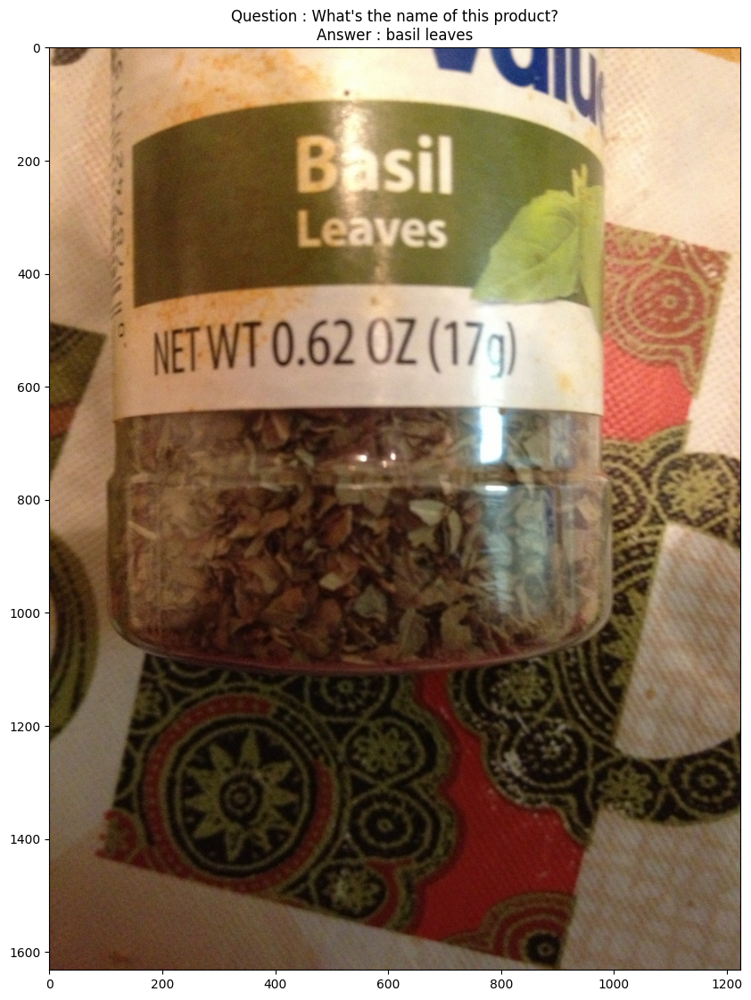

In [77]:
vqa_dataset.display(idx=0)

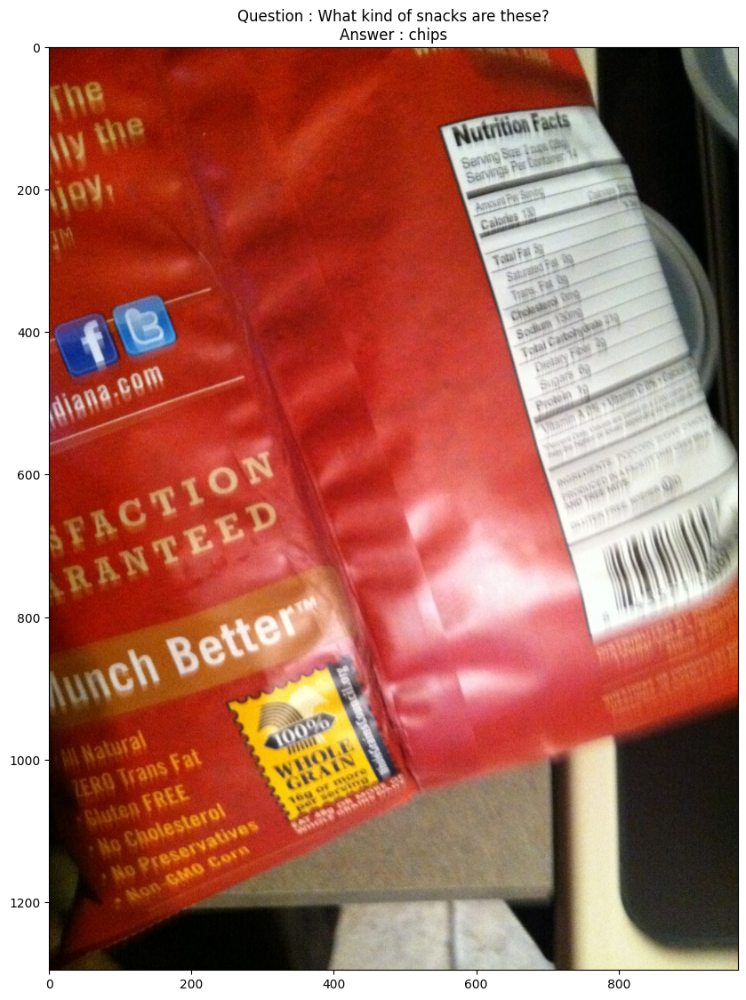

In [78]:
vqa_dataset.display(idx=100)

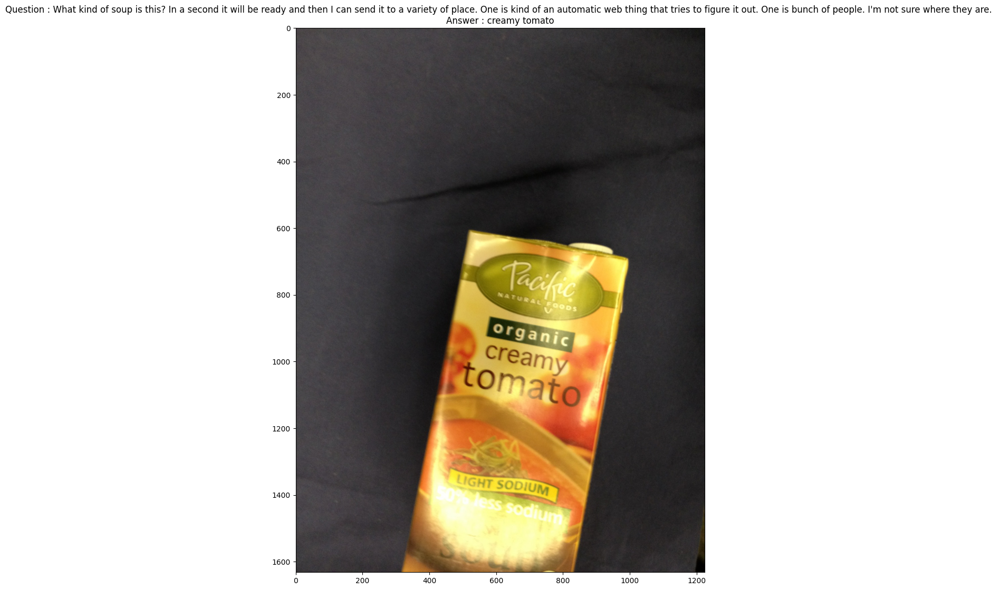

In [79]:
vqa_dataset.display(idx=1000)

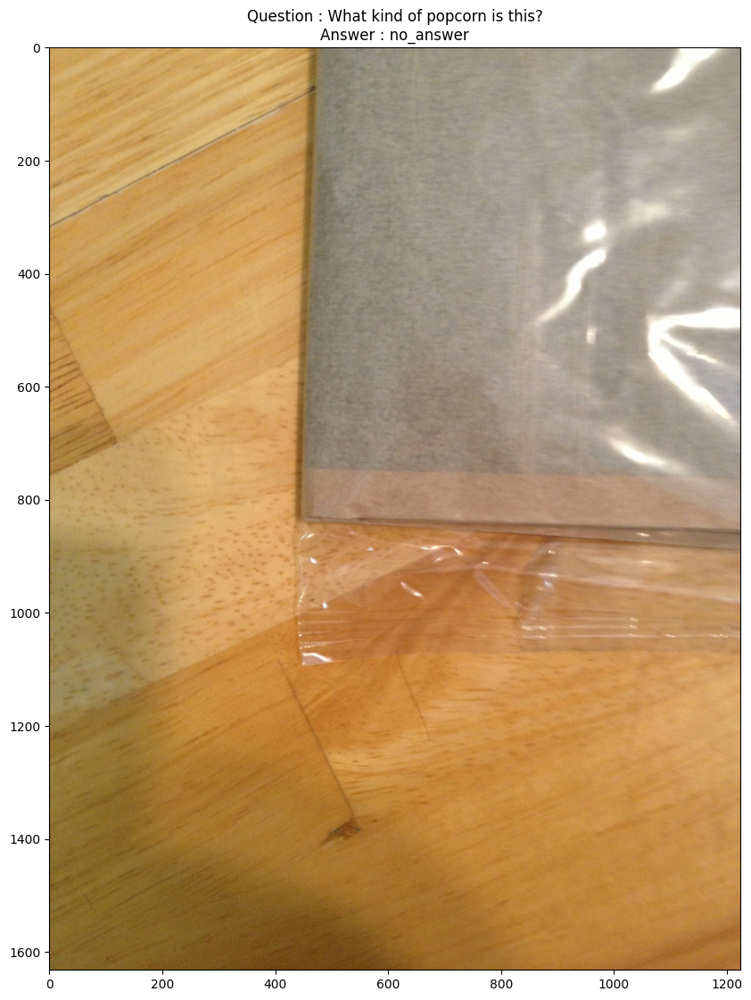

In [80]:
vqa_dataset.display(idx=4300)

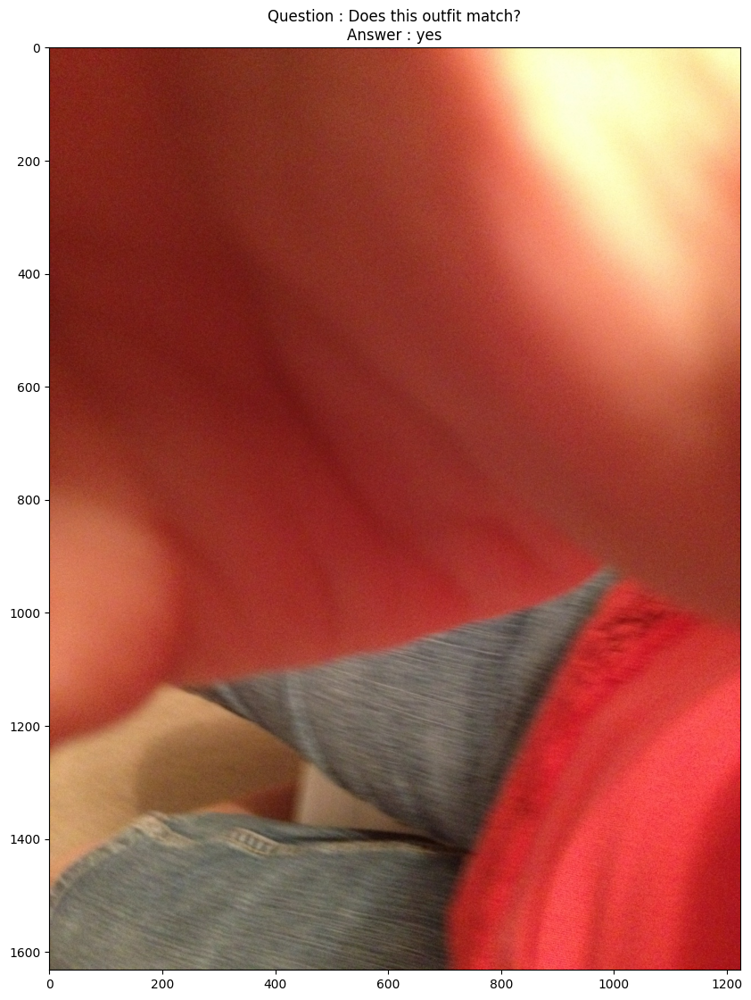

In [81]:
vqa_dataset.display(idx=9211)

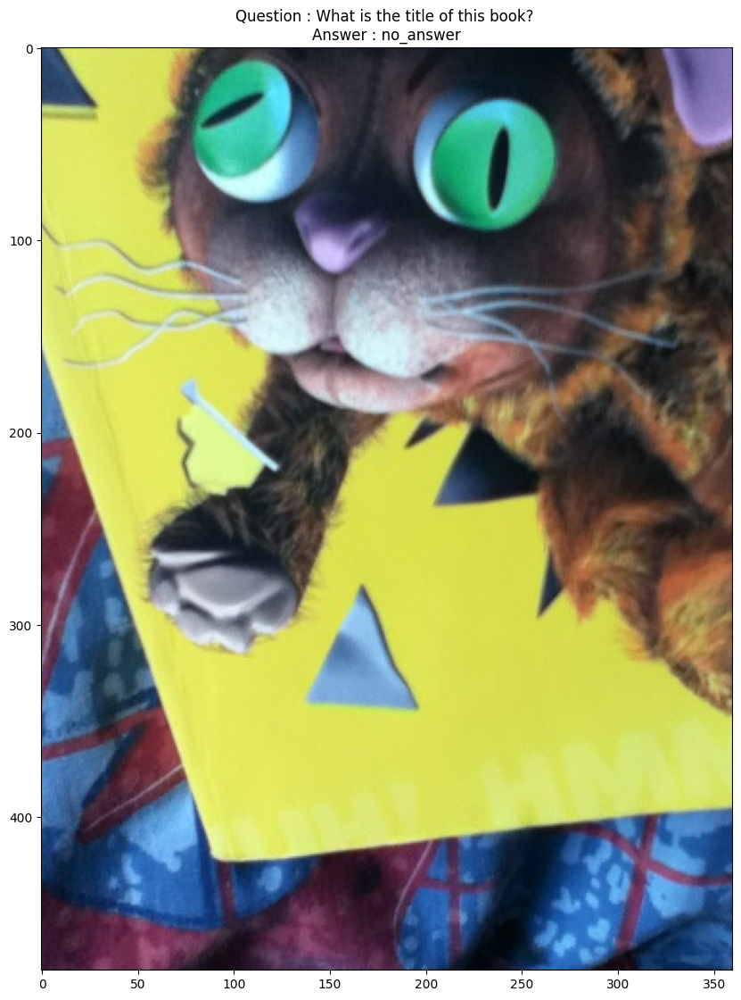

In [82]:
vqa_dataset.display(idx=101)

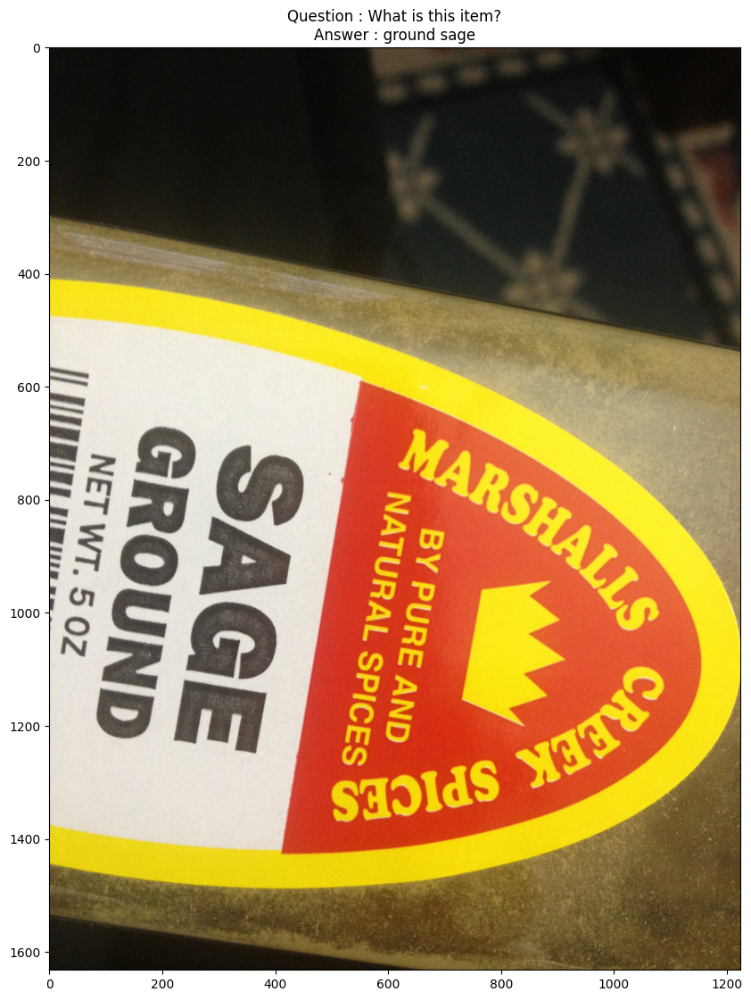

In [83]:
vqa_dataset.display(idx=500)